In [1]:
!pip install -U albumentations

!pip install --upgrade opencv-python

!pip install segmentation-models-pytorch==0.2.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 88 kB 2.5 MB/s 
     |████████████████████████████████| 376 kB 22.8 MB/s 
     |████████████████████████████████| 58 kB 7.1 MB/s 
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12421 sha256=8c9c39a5e0f540e58bfe2f2875d51358c9c3bd7287cf39654c2f81a19c5805e8
  Stored in directory: /root/.cache/pip/wheels/90/6b/0c/f0ad36d00310e65390b0d4c9218ae6250ac579c92540c9097a
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60965 sha256=8aaf76322377f9696deb0dc300f35eb5bbff34ada60457da0f4dbb8c73d7cd18
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96

In [2]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album

import segmentation_models_pytorch as smp

In [3]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/

Mounted at /content/drive
/content/drive/MyDrive


In [4]:
DATA_DIR = './cavs_flight_labels/'

x_train_dir = os.path.join(DATA_DIR, 'train', 'original_image')
y_train_dir = os.path.join(DATA_DIR, 'train', 'ground_truth')
print(x_train_dir)
print(y_train_dir)

x_valid_dir = os.path.join(DATA_DIR, 'val', 'original_image')
y_valid_dir = os.path.join(DATA_DIR, 'val', 'ground_truth')
print(x_valid_dir)
print(y_valid_dir)

x_test_dir = os.path.join(DATA_DIR, 'test', 'original_image')
y_test_dir = os.path.join(DATA_DIR, 'test', 'ground_truth')
print(x_test_dir)
print(y_test_dir)

./cavs_flight_labels/train/original_image
./cavs_flight_labels/train/ground_truth
./cavs_flight_labels/val/original_image
./cavs_flight_labels/val/ground_truth
./cavs_flight_labels/test/original_image
./cavs_flight_labels/test/ground_truth


In [5]:
class_dict = pd.read_csv("./cavs_flight_labels/label_class_dict.csv")
# Get class names
class_names = class_dict['name'].tolist()
# Get class RGB values
class_rgb_values = class_dict[['r','g','b']].values.tolist()

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['background', 'road']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]


In [6]:
# Useful to shortlist specific classes in datasets with large number of classes
select_classes = ['background', 'road']

# Get RGB values of required classes
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', select_classes)
print('Class RGB values: ', select_class_rgb_values)

Selected classes and their corresponding RGB values in labels:
Class Names:  ['background', 'road']
Class RGB values:  [[  0   0   0]
 [255 255 255]]


In [7]:
from numpy.ma.core import shape
# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

# Perform one hot encoding on label
def one_hot_encode(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes
    # Arguments
        label: The 2D array segmentation image label
        label_values
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        # print(shape(label))
        # print(colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)
    # print(shape(semantic_map))
    return semantic_map
    
# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format (depth is num_classes),
    to a 2D array with only 1 channel, where each pixel value is
    the classified class key.
    # Arguments
        image: The one-hot format image 
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of 1, where each pixel value is the classified 
        class key.
    """
    x = np.argmax(image, axis = -1)
    # print(shape(x))
    return x

# Perform colour coding on the reverse-one-hot outputs
def colour_code_segmentation(image, label_values):
    """
    Given a 1-channel array of class keys, colour code the segmentation results.
    # Arguments
        image: single channel array where each value represents the class key.
        label_values

    # Returns
        Colour coded image for segmentation visualization
    """
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]
    # print(image.astype(int))
    # print(shape(x))

    return x

In [8]:
class RoadsDataset(torch.utils.data.Dataset):

    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        
        self.image_paths = [os.path.join(images_dir, image_id) for image_id in sorted(os.listdir(images_dir))]
        self.mask_paths = [os.path.join(masks_dir, image_id) for image_id in sorted(os.listdir(masks_dir))]

        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read images and masks
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)

        # print(self.image_paths[i] , '---', self.mask_paths[i])
        # print(i)
        
        # one-hot-encode the mask
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        # return length of 
        return len(self.image_paths)

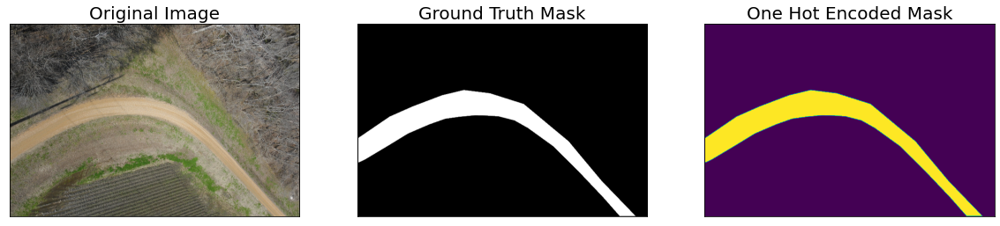

In [9]:
dataset = RoadsDataset(x_train_dir, y_train_dir, class_rgb_values=select_class_rgb_values)
random_idx = random.randint(0, len(dataset)-1)
image, mask = dataset[2]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

In [10]:
def get_training_augmentation():
    train_transform = [    
        album.Resize(height=256, width=384, interpolation=cv2.INTER_NEAREST),
        album.RandomCrop(height=256, width=256, always_apply=True),
        album.OneOf(
            [
                album.HorizontalFlip(p=1),
                album.VerticalFlip(p=1),
                album.RandomRotate90(p=1),
            ],
            p=0.75,
        ),
    ]
    return album.Compose(train_transform)


def get_validation_augmentation():   
    # Add sufficient padding to ensure image is divisible by 32
    test_transform = [
        album.PadIfNeeded(min_height=1536, min_width=1536, always_apply=True, border_mode=0),
    ]
    return album.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callable): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    """   
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)

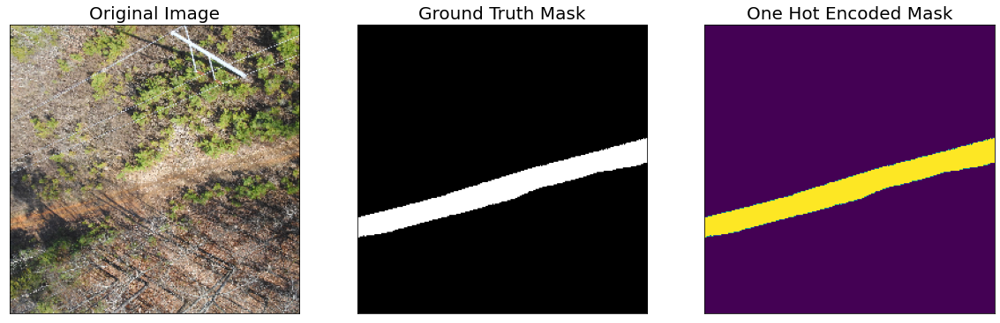

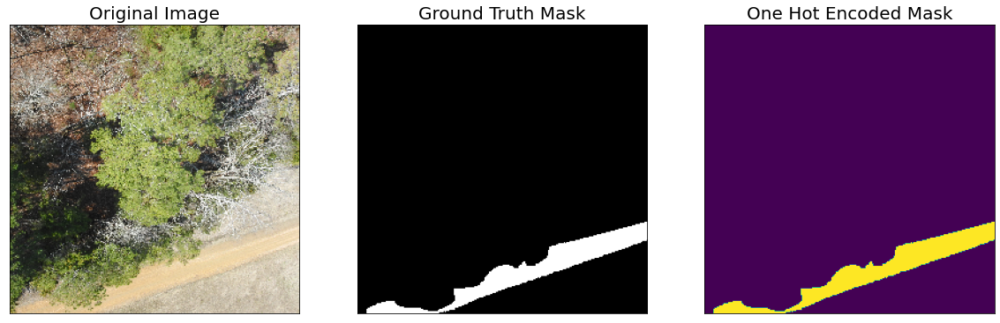

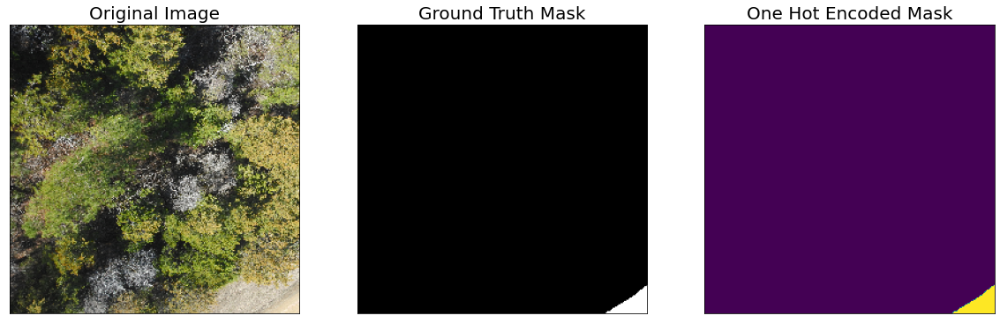

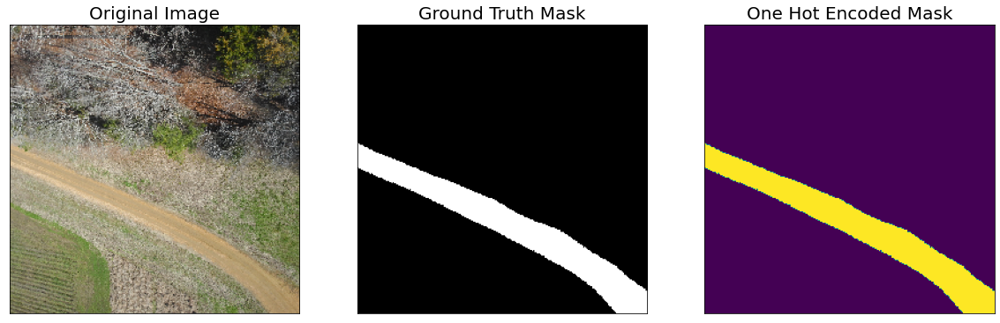

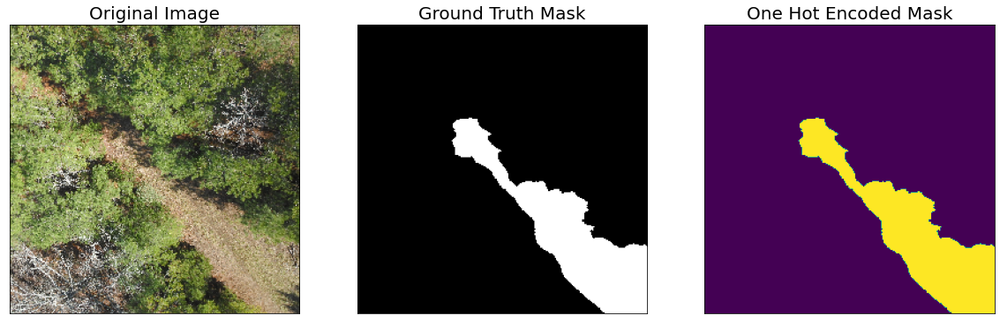

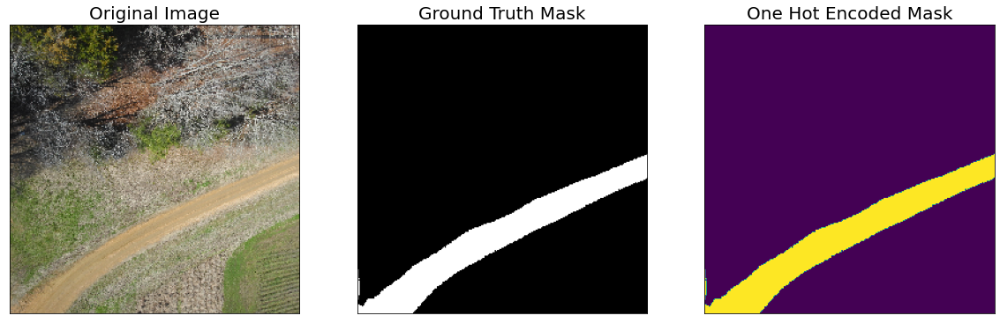

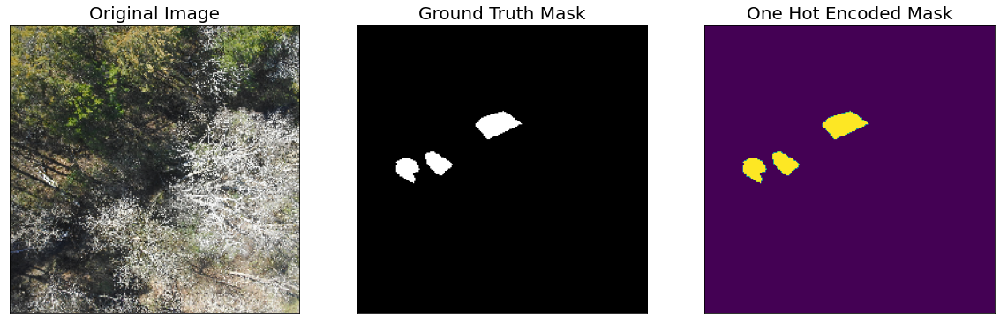

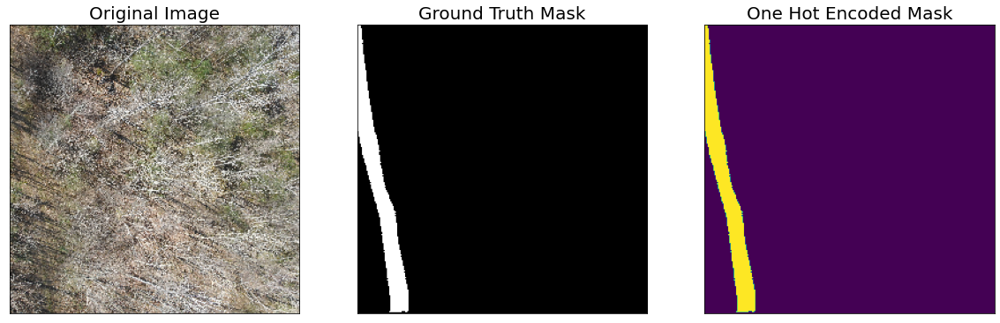

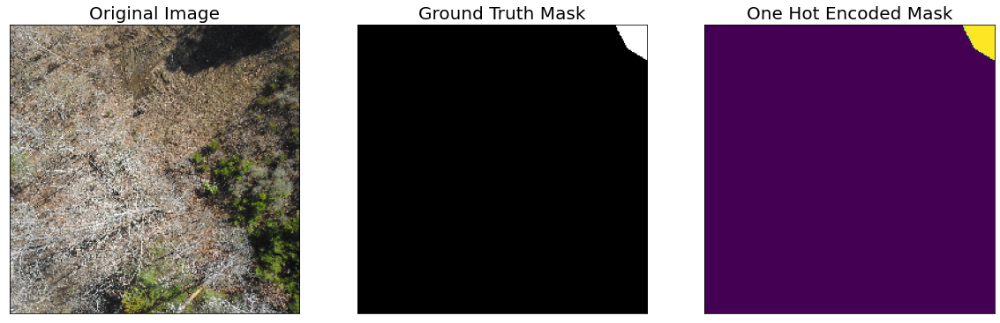

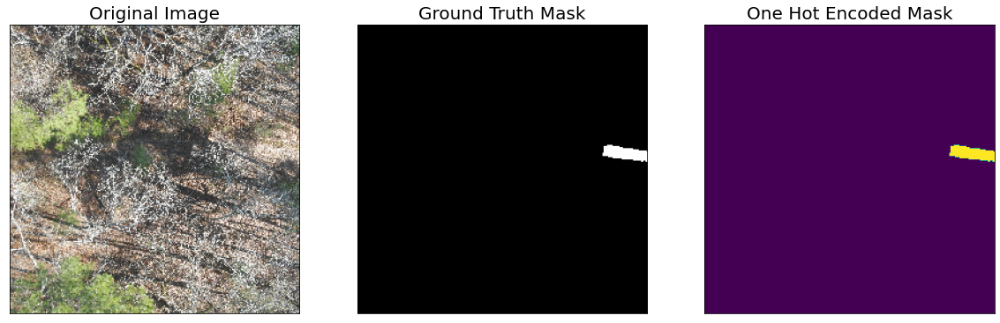

In [11]:
augmented_dataset = RoadsDataset(
    x_train_dir, y_train_dir, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)



# Different augmentations on a random image/mask pair (256*256 crop)
for i in range(10):
    random_idx = random.randint(0, len(augmented_dataset)-1)
    
    image, mask = augmented_dataset[random_idx]
    visualize(
        original_image = image,
        ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
        one_hot_encoded_mask = reverse_one_hot(mask)
    )


In [12]:
ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = select_classes
ACTIVATION = 'softmax' # could be None for logits or 'softmax2d' for multiclass segmentation

# create segmentation model with pretrained encoder
model = smp.DeepLabV3Plus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [13]:
# Get train and val dataset instances
train_dataset = RoadsDataset(
    x_train_dir, y_train_dir, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = RoadsDataset(
    x_valid_dir, y_valid_dir, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

# Get train and val data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=4)

In [14]:
# Set flag to train the model or not. If set to 'False', only prediction is performed (using an older model checkpoint)
TRAINING = True

# Set num of epochs
EPOCHS = 5

# Set device: `cuda` or `cpu`
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# define loss function
loss = smp.utils.losses.DiceLoss()

# define metrics
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

# define optimizer
optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.00008),
])

# define learning rate scheduler (not used in this NB)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5,
)

# load best saved model checkpoint from previous commit (if present)
if os.path.exists('../input/unet-resnet50-frontend-road-segmentation-pytorch/best_model_deeplab_softmax2d_cavs.pth'):
    model = torch.load('../input/unet-resnet50-frontend-road-segmentation-pytorch/best_model_deeplab_softmax2d_cavs.pth', map_location=DEVICE)

In [15]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [21]:
%%time

if TRAINING:

    best_iou_score = 0.0
    train_logs_list, valid_logs_list = [], []

    for i in range(0, EPOCHS):

        # Perform training & validation
        print('\nEpoch: {}'.format(i))
        train_logs = train_epoch.run(train_loader)
        valid_logs = valid_epoch.run(valid_loader)
        train_logs_list.append(train_logs)
        valid_logs_list.append(valid_logs)

        # Save model if a better val IoU score is obtained
        if best_iou_score < valid_logs['iou_score']:
            best_iou_score = valid_logs['iou_score']
            torch.save(model, './best_model_deeplab_softmax2d_cavs.pth')
            print('Model saved!')


Epoch: 0
valid: 100%|██████████| 33/33 [00:48<00:00,  1.47s/it, dice_loss - 0.6388, iou_score - 0.2449]
Model saved!

Epoch: 1
valid: 100%|██████████| 33/33 [00:48<00:00,  1.47s/it, dice_loss - 0.8205, iou_score - 0.09855]

Epoch: 2
valid: 100%|██████████| 33/33 [00:47<00:00,  1.45s/it, dice_loss - 0.8905, iou_score - 0.05352]

Epoch: 3
valid: 100%|██████████| 33/33 [00:48<00:00,  1.45s/it, dice_loss - 0.875, iou_score - 0.06265]

Epoch: 4
valid: 100%|██████████| 33/33 [00:48<00:00,  1.48s/it, dice_loss - 0.8884, iou_score - 0.05583]
CPU times: user 2min 53s, sys: 23.5 s, total: 3min 17s
Wall time: 23min 39s


In [22]:
# load best saved model checkpoint from the current run
if os.path.exists('./best_model_deeplab_softmax2d_cavs.pth'):
    best_model = torch.load('./best_model_deeplab_softmax2d_cavs.pth', map_location=DEVICE)
    print('Loaded DeepLabV3+ model from this run.')

# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('../input/road-extraction-from-satellite-images-deeplabv3/best_model_deeplab_softmax2d_cavs.pth'):
    best_model = torch.load('../input/road-extraction-from-satellite-images-deeplabv3/best_model_deeplab_softmax2d_cavs.pth', map_location=DEVICE)
    print('Loaded DeepLabV3+ model from a previous commit.')

Loaded DeepLabV3+ model from this run.


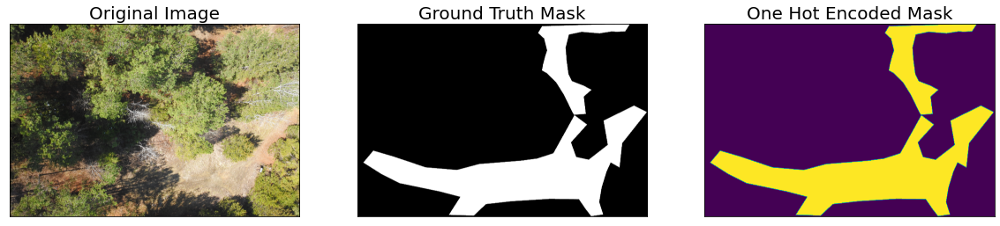

In [24]:
# create test dataloader to be used with UNet model (with preprocessing operation: to_tensor(...))
test_dataset = RoadsDataset(
    x_test_dir, 
    y_test_dir, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataloader = DataLoader(test_dataset)

# test dataset for visualization (without preprocessing transformations)
test_dataset_vis = RoadsDataset(
    x_test_dir, y_test_dir, 
    augmentation=get_validation_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

# get a random test image/mask index
random_idx = random.randint(0, len(test_dataset_vis)-1)
image, mask = test_dataset_vis[random_idx]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

# Notice the images / masks are 1536*1536 because of 18px padding on all sides. 
# This is to ensure the input image dimensions to UNet model are a multiple of 2 (to account for pooling & transpose conv. operations).

In [25]:
# Center crop padded image / mask to original image dims
def crop_image(image, target_image_dims=[1500,1500,3]):
   
    target_size = target_image_dims[0]
    image_size = len(image)
    padding = (image_size - target_size) // 2

    if padding<0:
        return image

    return image[
        padding:image_size - padding,
        padding:image_size - padding,
        :,
    ]


def preprocess_resize_image(image):
  # image = torch.from_numpy(image)
  # image = image.permute(1,2,0)
  # image = image.cpu().detach().numpy()
  # image = cv2.resize(image, (1536, 1536), interpolation = cv2.INTER_AREA)
  # image = torch.from_numpy(image)
  # image = image.permute(2,0, 1)
  # image = image.cpu().detach().numpy()
  image = np.transpose(image, (1,2,0))
  image = cv2.resize(image, (1536, 1536), interpolation = cv2.INTER_AREA)
  image = np.transpose(image, (2,0,1))
  return image

In [26]:
sample_preds_folder = 'sample_predictions/'
original_image_folder = 'original_image/'
# ground_truth_folder = 'ground_truth/'
predictions_folder = 'predictions/'
prediction_matrix = 'prediction_matrix/'
# road_heatmap_folder = 'road_heatmap/'
if not os.path.exists(sample_preds_folder):
    os.makedirs(sample_preds_folder + original_image_folder)
    # os.makedirs(sample_preds_folder + ground_truth_folder)
    os.makedirs(sample_preds_folder + predictions_folder)
    os.makedirs(sample_preds_folder + prediction_matrix)
    # os.makedirs(sample_preds_folder + road_heatmap_folder)

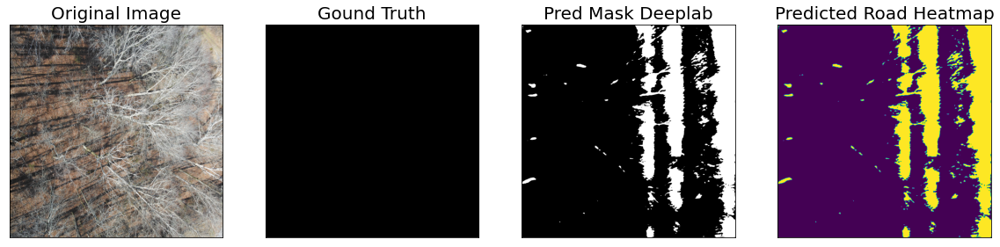

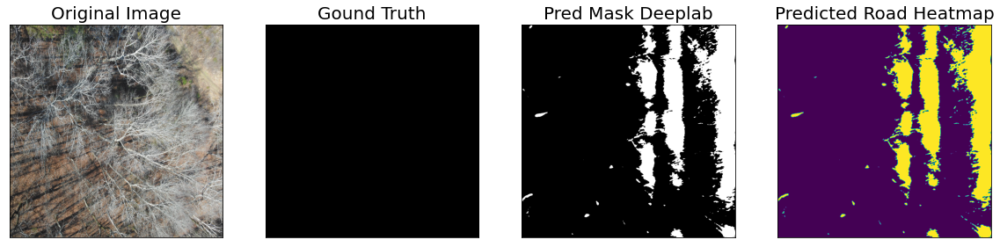

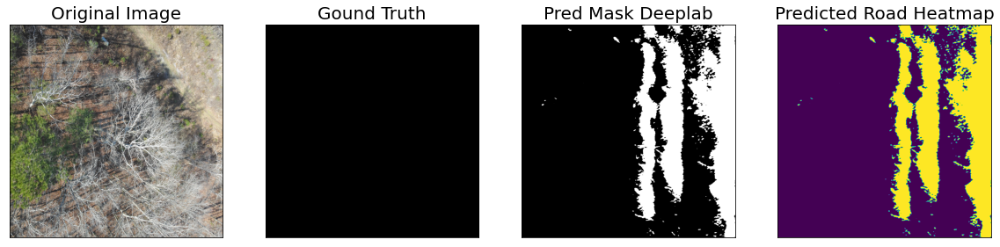

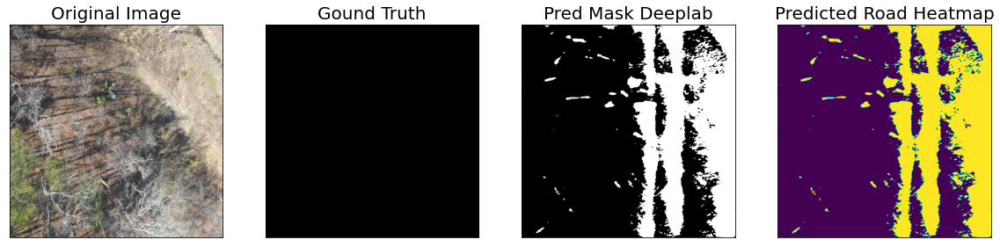

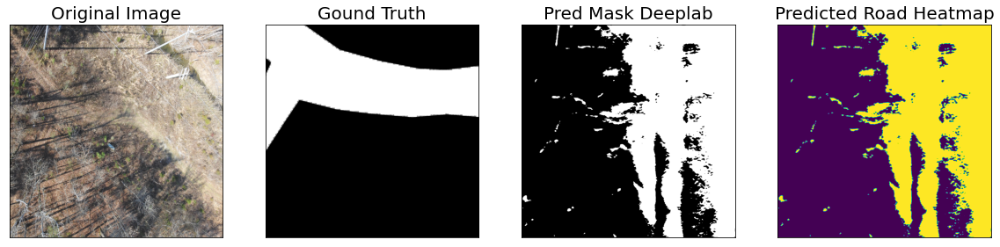

...

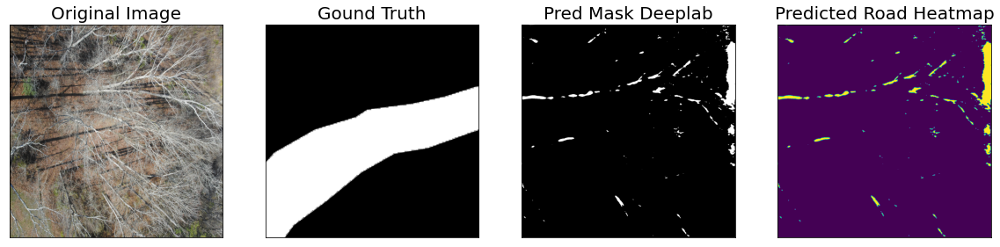

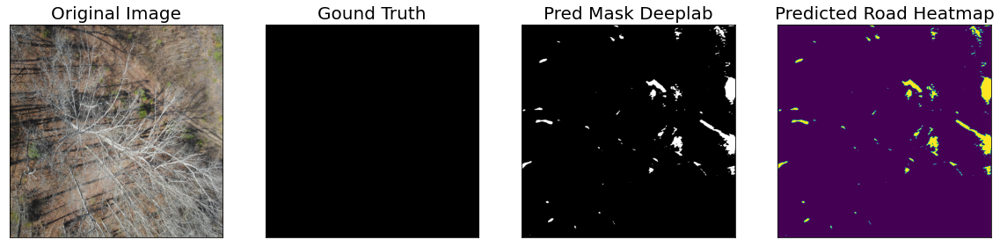

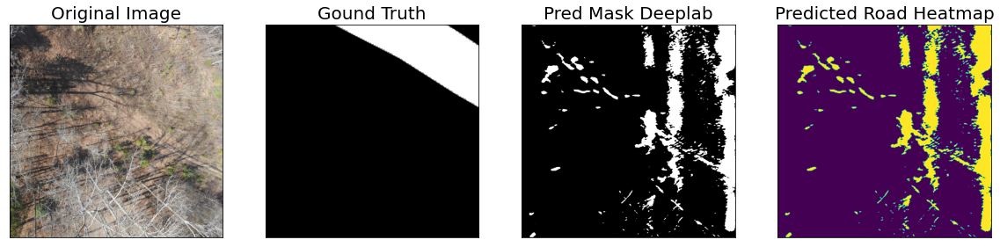

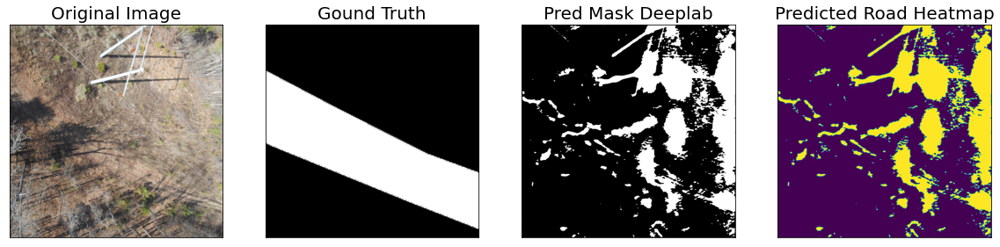

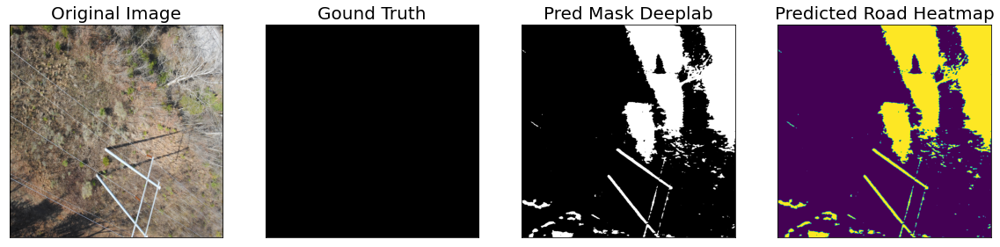

In [27]:
import pickle

for idx in range(len(test_dataset)):
    
    image, gt_mask = test_dataset[idx]
    image = preprocess_resize_image(image)

    # Convert gt_mask from `CHW` format to `HWC` format
    gt_mask = np.transpose(gt_mask,(1,2,0))
    gt_mask = crop_image(colour_code_segmentation(reverse_one_hot(gt_mask), select_class_rgb_values))

    image_vis = cv2.resize(test_dataset_vis[idx][0].astype('uint8'), (1536, 1536), interpolation = cv2.INTER_AREA)
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)

    pred_mask_deeplab = best_model(x_tensor)

    pred_mask_deeplab = pred_mask_deeplab.detach().squeeze().cpu().numpy()
   
    pred_mask_deeplab = np.transpose(pred_mask_deeplab,(1,2,0))
   
    pred_mask_deeplab = colour_code_segmentation(reverse_one_hot(pred_mask_deeplab), select_class_rgb_values)

    with open(os.path.join(sample_preds_folder, prediction_matrix, f"sample_pred_{idx}.pkl"), 'wb') as f:
        pickle.dump(pred_mask_deeplab, f)

    # Get prediction channel corresponding to road
    pred_road_heatmap = pred_mask_deeplab[:,:,select_classes.index('road')]
    # pred_road_heatmap = cv2.cvtColor(pred_road_heatmap, cv2.COLOR_BGR2RGB)

    cv2.imwrite(os.path.join(sample_preds_folder, original_image_folder, f"sample_pred_{idx}.png"), cv2.cvtColor(image_vis, cv2.COLOR_RGB2BGR))
    cv2.imwrite(os.path.join(sample_preds_folder, predictions_folder, f"sample_pred_{idx}.png"), pred_mask_deeplab)

    visualize(
        original_image = image_vis,
        gound_truth = gt_mask,
        pred_mask_deeplab = pred_mask_deeplab,
        predicted_road_heatmap = pred_road_heatmap
    )

In [28]:
test_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

valid_logs = test_epoch.run(test_dataloader)
print("Evaluation on Test Data: ")
print(f"Mean IoU Score: {valid_logs['iou_score']:.4f}")
print(f"Mean Dice Loss: {valid_logs['dice_loss']:.4f}")

valid: 100%|██████████| 38/38 [02:13<00:00,  3.51s/it, dice_loss - 0.8514, iou_score - 0.08433]
Evaluation on Test Data: 
Mean IoU Score: 0.0843
Mean Dice Loss: 0.8514


In [29]:
train_logs_df = pd.DataFrame(train_logs_list)
valid_logs_df = pd.DataFrame(valid_logs_list)
train_logs_df.T

,0,1,2,3,4
dice_loss,0.043683,0.041090,0.038967,0.038332,0.036645
iou_score,0.944244,0.947222,0.949341,0.948838,0.950326


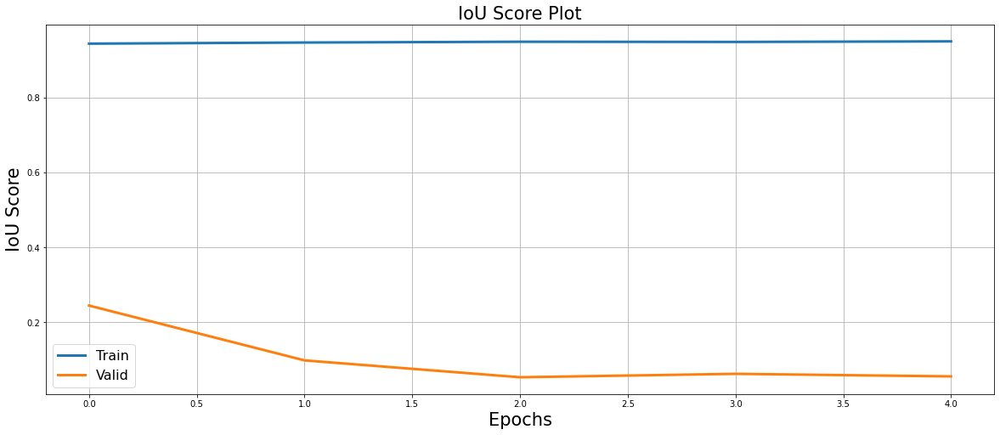

In [30]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.iou_score.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.iou_score.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=21)
plt.ylabel('IoU Score', fontsize=21)
plt.title('IoU Score Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('iou_score_plot.png')
plt.show()

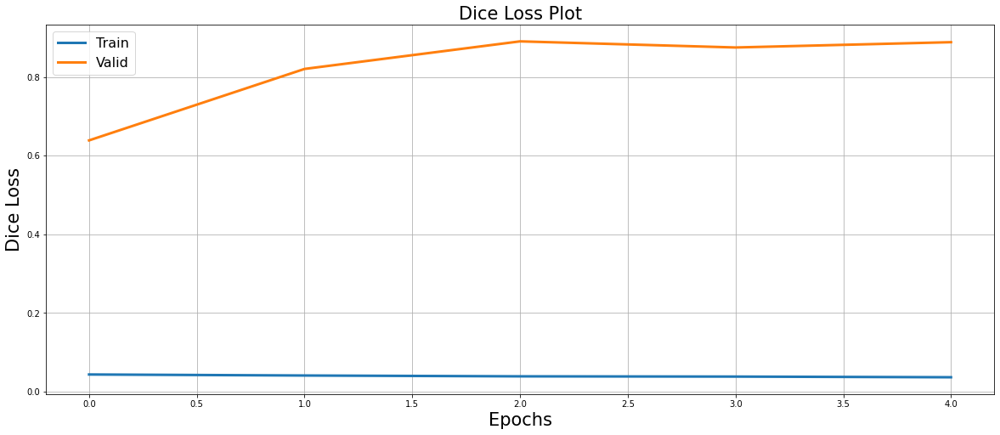

In [31]:
plt.figure(figsize=(20,8))
plt.plot(train_logs_df.index.tolist(), train_logs_df.dice_loss.tolist(), lw=3, label = 'Train')
plt.plot(valid_logs_df.index.tolist(), valid_logs_df.dice_loss.tolist(), lw=3, label = 'Valid')
plt.xlabel('Epochs', fontsize=21)
plt.ylabel('Dice Loss', fontsize=21)
plt.title('Dice Loss Plot', fontsize=21)
plt.legend(loc='best', fontsize=16)
plt.grid()
plt.savefig('dice_loss_plot.png')
plt.show()